In [3]:
import numpy as np
def sigmoid(x, w, b):
    return 1. / (1. + np.exp(-(w * x + b)))
def error(X, Y, w, b):
    err = 0
    for x, y in zip(X, Y):
        err += 0.5 * (sigmoid(x, w, b) - y) ** 2
    return err
def gradient_w(X, Y, w, b):
    grad_w = 0
    for x, y in zip(X, Y):
        y_pred = sigmoid(x, w, b)
        grad_w += (y_pred - y) * y_pred * (1 - y_pred) * x
    return grad_w
def gradient_b(X, Y, w, b):
    grad_b = 0
    for x, y in zip(X, Y):
        y_pred = sigmoid(x, w, b)
        grad_b += (y_pred - y) * y_pred * (1 - y_pred)
    return grad_b
def hessian_trace(X, Y, w, b):
    params = [w, b]
    hut_trace = []
    for param in params:
        v = np.random.randint(0, 2, size=param.shape) * 2.0 - 1.0  # Rademacher distribution {-1.0, 1.0}
        hv = gradient_w(X, Y, param, b) * v if param is w else gradient_b(X, Y, w, param) * v
        hut_trace.append(np.abs(hv * v))
    return hut_trace

In [4]:
class AdaHessianOptimizer:
    def __init__(self, lr=0.15, betas=(0.9, 0.999), eps=1e-4, weight_decay=0, hessian_power=1):
        self.lr = lr
        self.betas = betas
        self.eps = eps
        self.weight_decay = weight_decay
        self.hessian_power = hessian_power
        self.exp_avg = None
        self.exp_hessian_diag_sq = None
        self.step_count = 0
    def step(self, gradsH, params, grads):
        if self.exp_avg is None:
            self.exp_avg = [np.zeros_like(param) for param in params]
            self.exp_hessian_diag_sq = [np.zeros_like(param) for param in params]
        self.step_count += 1
        for i in range(len(params)):
            param = params[i]
            grad = grads[i]
            gradH = gradsH[i]
            if grad is None:
                continue
            if self.exp_avg[i] is None:
                self.exp_avg[i] = np.zeros_like(param)
                self.exp_hessian_diag_sq[i] = np.zeros_like(param)
            self.exp_avg[i] = self.betas[0] * self.exp_avg[i] + (1 - self.betas[0]) * grad
            self.exp_hessian_diag_sq[i] = self.betas[1] * self.exp_hessian_diag_sq[i] + (1 - self.betas[1]) * np.square(gradH)
            bias_correction1 = 1 - self.betas[0] ** self.step_count
            bias_correction2 = 1 - self.betas[1] ** self.step_count
            denom = np.sqrt(self.exp_hessian_diag_sq[i] / bias_correction2).clip(min=self.eps)
            denom **= self.hessian_power
            param -= self.lr * (self.exp_avg[i] / bias_correction1 / denom + self.weight_decay * param)

        return params


In [5]:
# Data and Parameters
w_init=np.array([-6],dtype=float)
b_init=np.array([5],dtype=float)
X = np.asarray([3.5, 2, 3.2, -2.0, 5, -0.5])
Y = np.asarray([0.5, 0.50, 0.5,  0.5, 0.1,  0.3])
# Initialize AdaHessian optimizer
optimizer = AdaHessianOptimizer()
losses=[]
weights=[]
biases=[]
# Training loop
epochs = 200
for epoch in range(epochs):
    # Compute gradients
    grads_w = gradient_w(X, Y, w_init, b_init)
    grads_b = gradient_b(X, Y, w_init, b_init)
    gradsH_w = hessian_trace(X, Y, w_init, b_init)[0]  # Hessian trace for weight parameter
    gradsH_b = hessian_trace(X, Y, w_init, b_init)[1]  # Hessian trace for bias parameter
    # Update parameters using AdaHessian optimizer
    w_init, b_init = optimizer.step([gradsH_w, gradsH_b], [w_init, b_init], [grads_w, grads_b])
    # Compute and print loss
    loss = error(X, Y, w_init, b_init)
    weights.append(np.copy(w_init))  # Create a copy of w_init before appending
    biases.append(np.copy(b_init))
    losses.append(loss)
    print(f"Epoch {epoch + 1}, Loss: {loss}")

Epoch 1, Loss: [0.74906847]
Epoch 2, Loss: [0.74868967]
Epoch 3, Loss: [0.74810771]
Epoch 4, Loss: [0.74722685]
Epoch 5, Loss: [0.74590861]
Epoch 6, Loss: [0.74395394]
Epoch 7, Loss: [0.74108033]
Epoch 8, Loss: [0.73689549]
Epoch 9, Loss: [0.73087482]
Epoch 10, Loss: [0.72236157]
Epoch 11, Loss: [0.71063178]
Epoch 12, Loss: [0.69510177]
Epoch 13, Loss: [0.67578878]
Epoch 14, Loss: [0.65408462]
Epoch 15, Loss: [0.63355299]
Epoch 16, Loss: [0.61950216]
Epoch 17, Loss: [0.61525755]
Epoch 18, Loss: [0.61744778]
Epoch 19, Loss: [0.61933192]
Epoch 20, Loss: [0.61656417]
Epoch 21, Loss: [0.60580256]
Epoch 22, Loss: [0.58274181]
Epoch 23, Loss: [0.54635432]
Epoch 24, Loss: [0.50696116]
Epoch 25, Loss: [0.48945521]
Epoch 26, Loss: [0.50874606]
Epoch 27, Loss: [0.53291297]
Epoch 28, Loss: [0.54000505]
Epoch 29, Loss: [0.53138592]
Epoch 30, Loss: [0.51380544]
Epoch 31, Loss: [0.49635356]
Epoch 32, Loss: [0.48819131]
Epoch 33, Loss: [0.49184035]
Epoch 34, Loss: [0.50092688]
Epoch 35, Loss: [0.5079

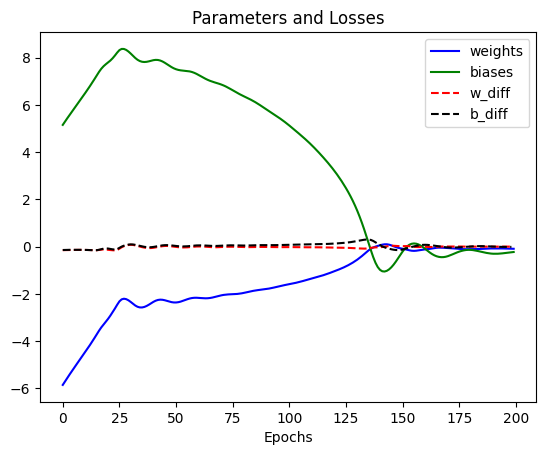

In [7]:
import matplotlib.pyplot as plt
plt.plot(weights, 'b', label='weights')
plt.plot(biases, 'g', label='biases')
w_diff = [t - s for t, s in zip(weights, weights[1:])]
b_diff = [t - s for t, s in zip(biases, biases[1:])]
plt.plot(w_diff, 'r--', label='w_diff')
plt.plot(b_diff, 'k--', label='b_diff')
plt.legend()
plt.title('Parameters and Losses')
plt.xlabel('Epochs')
plt.savefig('parameters_scratch',dpi=300)
plt.show()


In [8]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors
from matplotlib import animation, rc
from IPython.display import HTML
import seaborn as sns
animation_frames = 20
plot_2d = True
plot_3d = True

In [9]:
def plot_animate_3d(i):
  i = int(i*(epochs/animation_frames))
  line1.set_data(weights[:i+1], biases[:i+1])
  line1.set_3d_properties(losses[:i+1])
  line2.set_data(weights[:i+1],biases[:i+1])
  line2.set_3d_properties(np.zeros(i+1) - 1)
  title.set_text('Epoch: {: d}, Error: {:.4f}'.format(i, e_h[i]))
  return line1, line2, title

In [10]:
def c(x):
  return [round(float(i),2) for i in x]
weights=c(weights)
biases=c(biases)
losses=c(losses)
w_min = -15
w_max = 15
b_min = -15
b_max = 15

<ipython-input-10-3bb3edb9350c>:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return [round(float(i),2) for i in x]


<ipython-input-11-2073c100f664>:19: MatplotlibDeprecationWarning: The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  ax.dist = 12


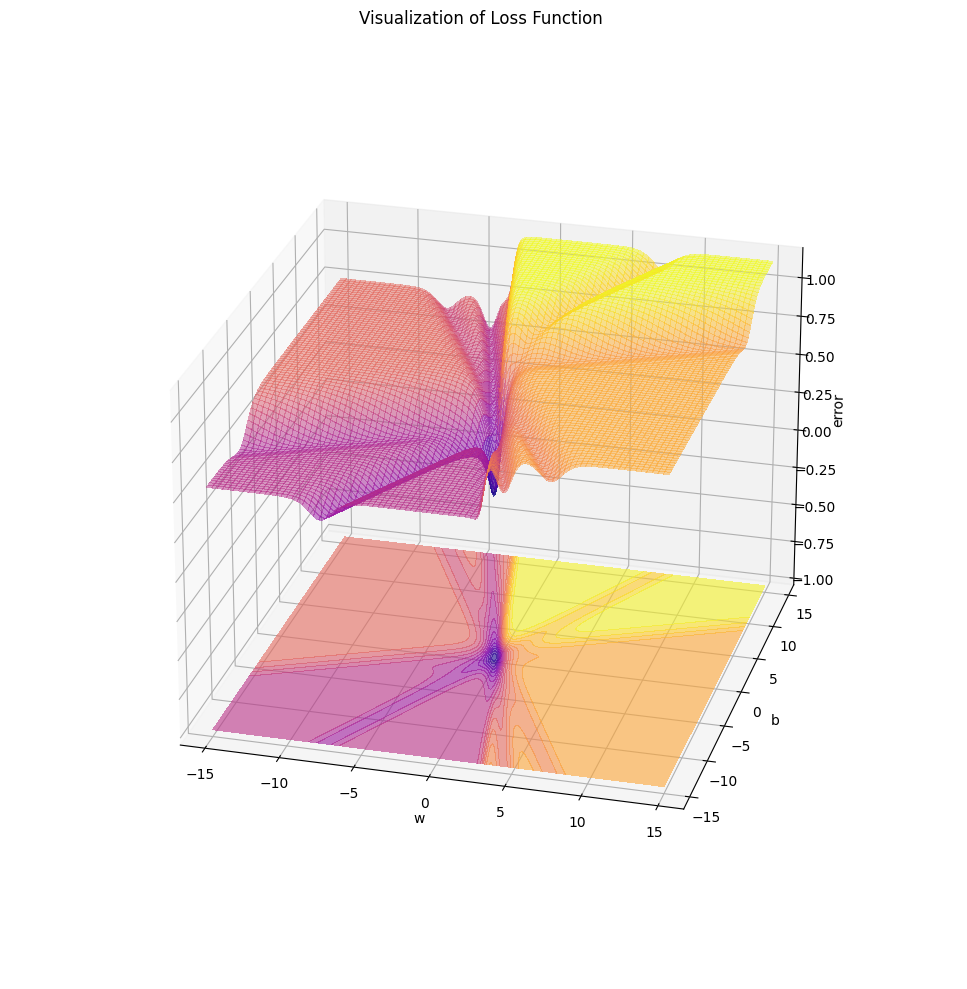

In [11]:
def plotter_3d(w_min,w_max,b_min,b_max,error,save=False):

  W = np.linspace(w_min, w_max, 256)
  b = np.linspace(b_min, b_max, 256)
  WW, BB = np.meshgrid(W, b)
  Z = error(X, Y, WW, BB)

  fig = plt.figure(figsize=(20,10),dpi=100)
  ax = fig.add_subplot(111, projection='3d')  # Add a subplot with 3D projection
  surf = ax.plot_surface(WW, BB, Z, rstride=3, cstride=3, alpha=0.5, cmap='plasma', linewidth=0, antialiased=False)
  cset = ax.contourf(WW, BB, Z, 25, zdir='z', offset=-1, alpha=0.6, cmap='plasma')
  ax.set_xlabel('w')
  ax.set_xlim(w_min - 1, w_max + 1)
  ax.set_ylabel('b')
  ax.set_ylim(b_min - 1, b_max + 1)
  ax.set_zlabel('error')
  ax.set_zlim(-1, np.max(Z))
  ax.view_init(elev=25, azim=-75)  # azim = -20
  ax.dist = 12
  title = ax.set_title('Visualization of Loss Function ')
  fig.tight_layout()
  plt.savefig('3d_scratch',dpi=300)
  plt.show()

plotter_3d(w_min,w_max,b_min,b_max,error,save=False)

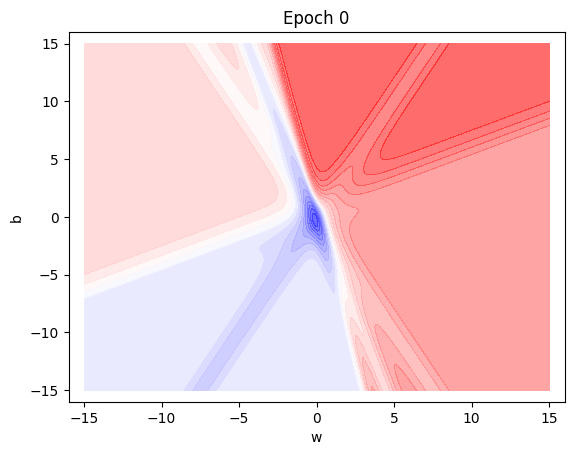

In [12]:
if plot_2d:
  W = np.linspace(w_min, w_max, 256)
  b = np.linspace(b_min, b_max, 256)
  WW, BB = np.meshgrid(W, b)
  Z = error(X, Y, WW, BB)

  fig = plt.figure(dpi=100)
  ax = plt.subplot(111)
  ax.set_xlabel('w')
  ax.set_xlim(w_min - 1, w_max + 1)
  ax.set_ylabel('b')
  ax.set_ylim(b_min - 1, b_max + 1)
  title = ax.set_title('Epoch 0')
  cset = plt.contourf(WW, BB, Z, 25, alpha=0.6, cmap=cm.bwr)
  plt.savefig('2D VisualiZation')
  plt.show()
def plot_animate_2d(i):
  i = int(i*(epochs/animation_frames))
  line.set_data(weights[:i+1], biases[:i+1])
  title.set_text('Epoch: {: d}, Error: {:.4f}'.format(i,losses[i]))
  return line, title
if plot_2d:
  i = 0
  line, = ax.plot(weights[:i+1],biases[:i+1], color='black',marker='.')
  anim = animation.FuncAnimation(fig, func=plot_animate_2d, frames=animation_frames)
  rc('animation', html='jshtml')
  HTML(anim.to_jshtml())

  # Save the animation as a GIF using Pillow
  anim.save('animation.gif', writer='pillow')
  anim

In [13]:
anim

<ipython-input-14-de6361345c52>:20: MatplotlibDeprecationWarning: The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  ax.dist=12


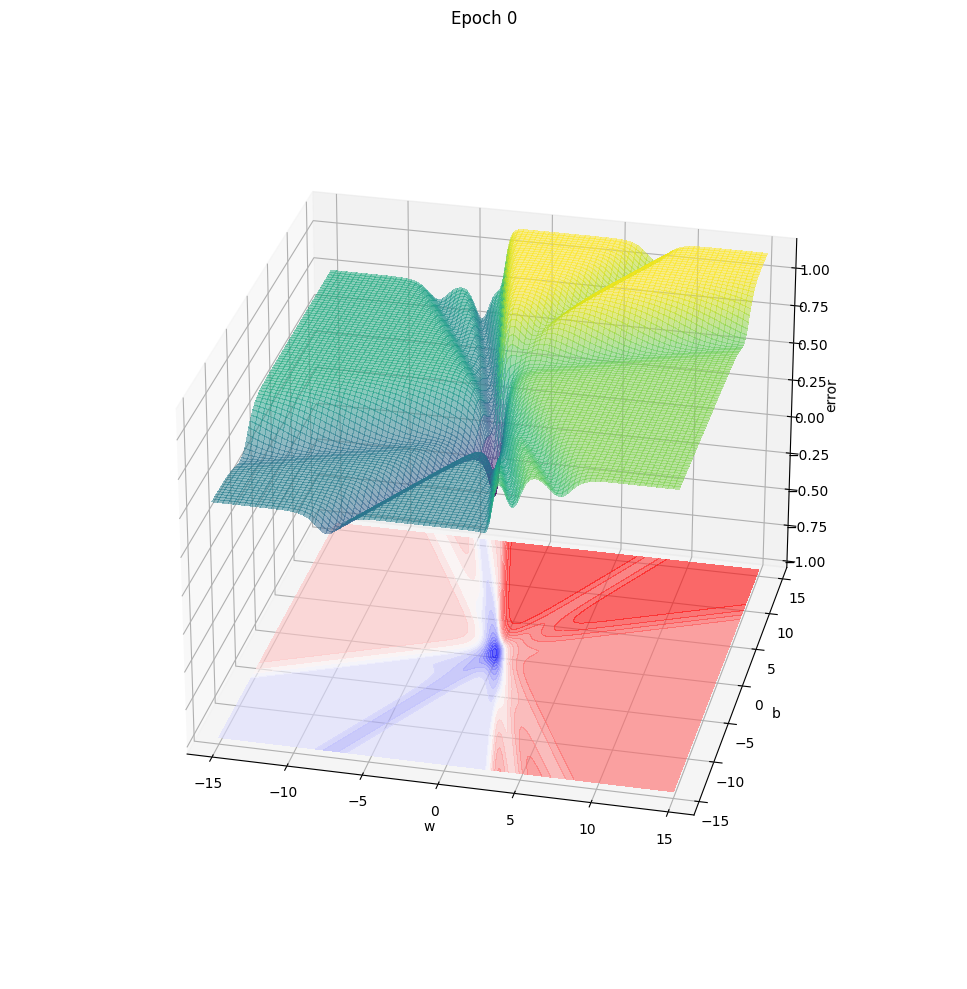

In [14]:
plot_3d=True

if plot_3d:
  W = np.linspace(w_min, w_max, 256)
  b = np.linspace(b_min, b_max, 256)
  WW, BB = np.meshgrid(W, b)
  Z = error(X, Y, WW, BB)

  fig = plt.figure(figsize=(20,10),dpi=100)
  ax = fig.add_subplot(111,projection='3d')
  surf = ax.plot_surface(WW, BB, Z, rstride=3, cstride=3, alpha=0.5, cmap='viridis', linewidth=0, antialiased=False)
  cset = ax.contourf(WW, BB, Z, 25, zdir='z', offset=-1, alpha=0.6, cmap=cm.bwr)
  ax.set_xlabel('w')
  ax.set_xlim(w_min - 1, w_max + 1)
  ax.set_ylabel('b')
  ax.set_ylim(b_min - 1, b_max + 1)
  ax.set_zlabel('error')
  ax.set_zlim(-1, np.max(Z))
  ax.view_init (elev=28, azim=-77) # azim = -20
  ax.dist=12
  title = ax.set_title('Epoch 0')
  fig.tight_layout()
  plt.show()
def plot_animate_3d(i):
  i = int(i*(epochs/animation_frames))
  line1.set_data(weights[:i+1], biases[:i+1])
  line1.set_3d_properties(losses[:i+1])
  line2.set_data(weights[:i+1], biases[:i+1])
  line2.set_3d_properties(np.zeros(i+1) - 1)
  title.set_text('Epoch: {: d}, Error: {:.4f}'.format(i,losses[i]))
  return line1, line2, title
if plot_3d:
  i = 0
  line1, = ax.plot(weights[:i+1],biases[:i+1], losses[:i+1], color='black',marker='.')
  line2, = ax.plot(weights[:i+1],biases[:i+1], np.zeros(i+1) - 1, color='red', marker='.')
  anim = animation.FuncAnimation(fig, func=plot_animate_3d, frames=animation_frames)
  rc('animation', html='jshtml')
  HTML(anim.to_jshtml())

  # Save the animation as a GIF using Pillow
  anim.save('animation.gif', writer='pillow')
  anim


In [15]:
anim

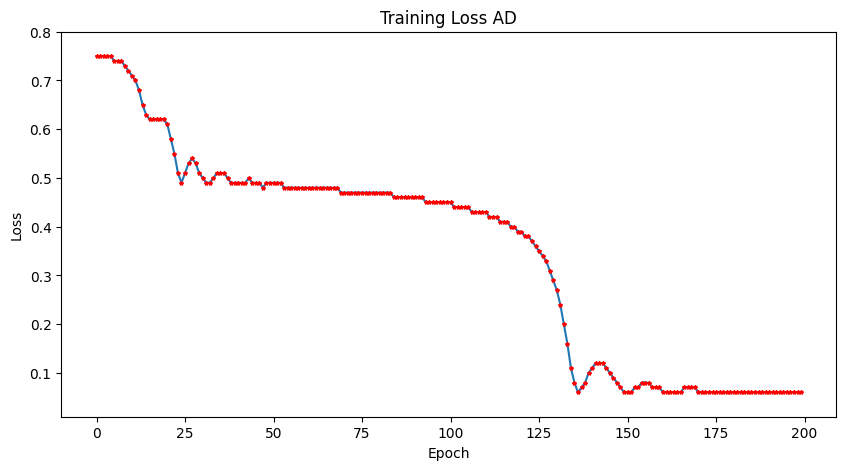

In [16]:
# Plot the loss over epochs
plt.figure(figsize=(10,5))
plt.plot(losses,marker='*',markersize=3,mec='red')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss AD')
plt.ylim(0.01,0.8)
plt.savefig('Scratch_Loss')
plt.show()

## Comparison Cell

In [17]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors
from matplotlib import animation, rc
from IPython.display import HTML
import numpy as np
import seaborn as sns

In [18]:
import torch
import torch.nn as nn
import numpy as np
from tqdm import tqdm

# Define the sigmoid neuron model
class SigmoidNeuron(nn.Module):
    def __init__(self):
        super(SigmoidNeuron, self).__init__()
        self.linear = nn.Linear(1, 1)  # One input feature, one output
        # Initialize weights and bias
        self.linear.weight.data.fill_(-6.0)
        self.linear.bias.data.fill_(5.0)
    def forward(self, x):
        return torch.sigmoid(self.linear(x))
#random seeds
np.random.seed(0)
# data
X = torch.tensor([3.5, 2, 3.2, -2.0, 5, -0.5], dtype=torch.float32).unsqueeze(1)  # Add dimension for input feature
#noise = np.random.normal(0, 1.8, X.shape[0])  # Increased standard deviation (from 0.5 to 1.0)
Y = torch.tensor([0.5, 0.50, 0.5,  0.5, 0.1,  0.3], dtype=torch.float32).unsqueeze(1)
# Initialize the model
model = SigmoidNeuron()
# Define the loss function (Mean Squared Error)
criterion = nn.MSELoss()
# Define the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.1)
# Training loop
epochs = 200
adam_losses = []
adam_weights = []
adam_biases = []
for epoch in tqdm(range(epochs)):
    # Forward pass
    outputs = model(X)
    # Compute loss
    loss = criterion(outputs, Y)
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    # Save loss, weights, and biases for visualization
    adam_losses.append(loss.item())
    adam_weights.append(model.linear.weight.item())
    adam_biases.append(model.linear.bias.item())
# Convert lists to numpy arrays for plotting
losses = np.array(adam_losses)
weights = np.array(adam_weights)
biases = np.array(adam_biases)




100%|██████████| 200/200 [00:00<00:00, 768.71it/s]


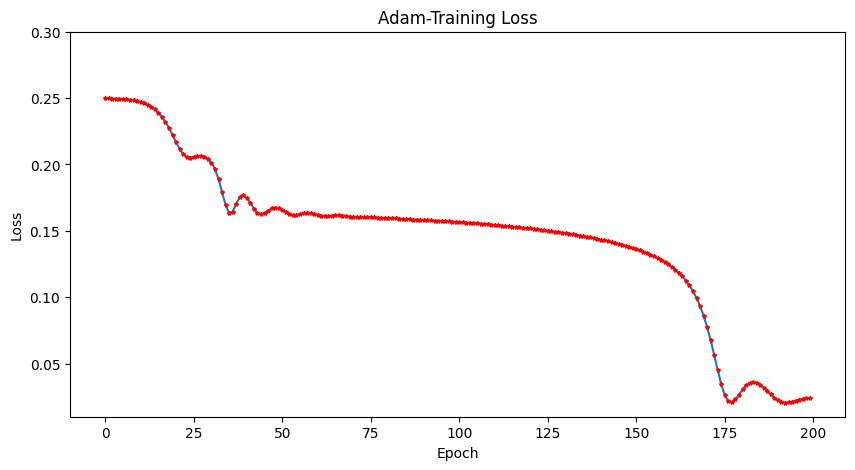

In [19]:
# Plot the loss over epochs
plt.figure(figsize=(10,5))
plt.plot(losses,marker='*',markersize=3,mec='red')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Adam-Training Loss')
plt.ylim(0.01,0.30)
plt.savefig('Adam_loss',dpi=300)
plt.show()

In [20]:
! pip install torch_optimizer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 50.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 46.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 73.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 989.0 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 12.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━

In [21]:
import torch_optimizer as optim

In [22]:
model = SigmoidNeuron()
criterion = nn.MSELoss()
optimizer = optim.Adahessian(
    model.parameters(),
    lr= 1.0,
    betas= (0.9, 0.999),
    eps= 1e-4,
    weight_decay=0.0,
    hessian_power=1.0,
)
epochs = 200
ada_losses = []
ada_weights = []
ada_biases = []
for epoch in tqdm(range(epochs)):
    outputs = model(X)
    loss = criterion(outputs, Y)
    optimizer.zero_grad()
    loss.backward(create_graph=True)
    optimizer.step()
    ada_losses.append(loss.item())
    ada_weights.append(model.linear.weight.item())
    ada_biases.append(model.linear.bias.item())
ada_losses = np.array(ada_losses)
ada_weights = np.array(ada_weights)
ada_biases = np.array(ada_biases)


  0%|          | 0/200 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/autograd/__init__.py:266: UserWarning: Using backward() with create_graph=True will create a reference cycle between the parameter and its gradient which can cause a memory leak. We recommend using autograd.grad when creating the graph to avoid this. If you have to use this function, make sure to reset the .grad fields of your parameters to None after use to break the cycle and avoid the leak. (Triggered internally at ../torch/csrc/autograd/engine.cpp:1177.)
  Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
100%|██████████| 200/200 [00:00<00:00, 372.42it/s]


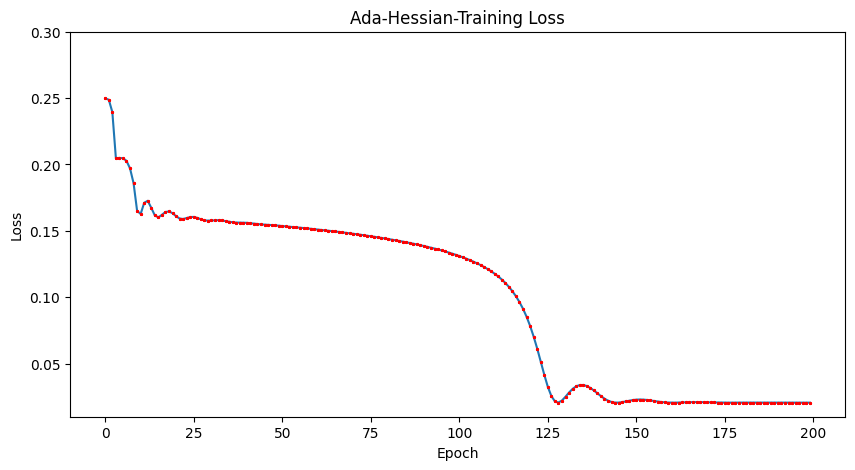

In [23]:
# Plot the loss over epochs
plt.figure(figsize=(10,5))
plt.plot(ada_losses,marker='*',markersize=2,mec='r')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Ada-Hessian-Training Loss')
plt.ylim(0.01,0.30)
plt.show()


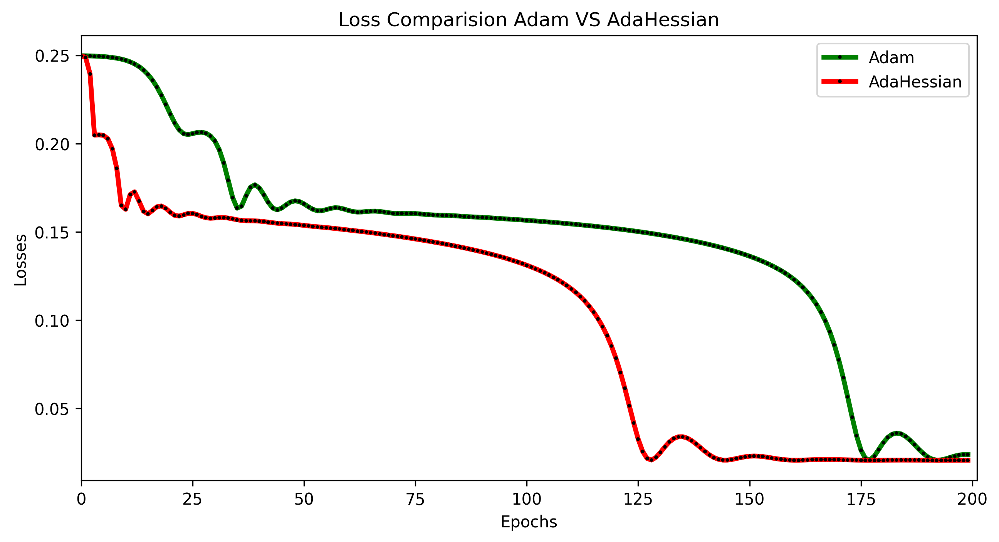

In [24]:
plt.figure(figsize=(10,5),dpi=300)
plt.plot(adam_losses,'g',marker='*',markersize=2,mec='black',linewidth=3,label='Adam')
plt.plot(ada_losses,'r',marker='*',markersize=2,mec='black',linewidth=3,label='AdaHessian')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Losses')
plt.title('Loss Comparision Adam VS AdaHessian')
plt.xlim(0,201)
plt.savefig('Adam VS Ada (LOss)',dpi=600)
plt.show()

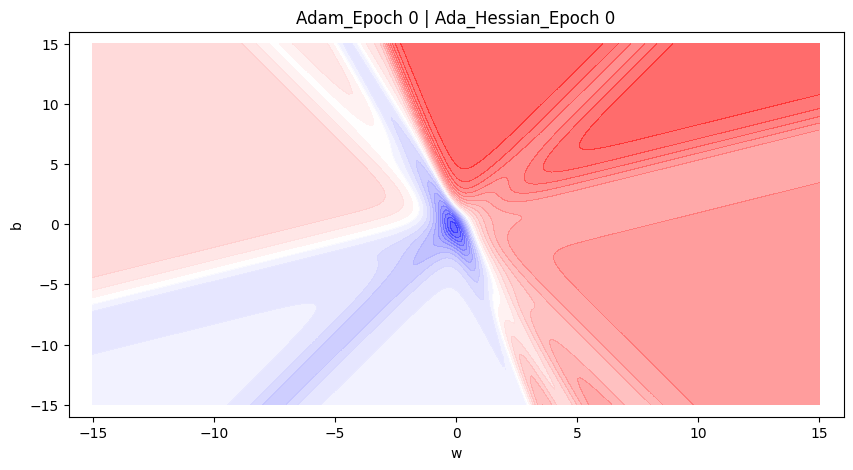

In [25]:
w_min = -15
w_max = 15
b_min = -15
b_max = 15

plot_2d=True
if plot_2d:
  W = np.linspace(w_min, w_max, 256)
  b = np.linspace(b_min, b_max, 256)
  WW, BB = np.meshgrid(W, b)
  Z = np.zeros_like(WW)

  for i in range(len(W)):
      for j in range(len(b)):
          Z[i, j] = criterion(torch.sigmoid(torch.tensor(WW[i, j]) * X + torch.tensor(BB[i, j])), Y).item()

  fig = plt.figure(figsize=(10,5),dpi=100)
  ax = plt.subplot(111)
  ax.set_xlabel('w')
  ax.set_xlim(w_min - 1, w_max + 1)
  ax.set_ylabel('b')
  ax.set_ylim(b_min - 1, b_max + 1)
  title = ax.set_title('Adam_Epoch 0 | Ada_Hessian_Epoch 0')
  cset = plt.contourf(WW, BB, Z, 25, alpha=0.6, cmap=cm.bwr)
  plt.savefig('ADA and ADAM 2d',dpi=600)
  plt.show()

In [26]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Assuming you have defined the necessary variables for the plot
animation_frames = 10  # Adjust this value as needed
plot_2d=True
def plot_animate_2d(i):
    i = int(i * (epochs / animation_frames))
    line.set_data(adam_weights[:i + 1], adam_biases[:i + 1])
    ada_line.set_data(ada_weights[:i + 1], ada_biases[:i + 1])  # Add AdaHessian weights and biases
    combined_error = 'Epoch: {: d}, Adam_Error: {:.4f} | AdaHessian Error: {:.4f}'.format(i, adam_losses[i], ada_losses[i])
    title.set_text(combined_error)
    return line, ada_line, title

if plot_2d:
    i = 0
    line, = ax.plot(adam_weights[:i + 1], adam_biases[:i + 1], color='black', marker='*',markersize=2, label='Adam')
    ada_line, = ax.plot(ada_weights[:i + 1], ada_biases[:i + 1], color='red', marker='*',markersize=2, label='AdaHessian')
    ax.legend()  # Add legend to the plot
    anim = animation.FuncAnimation(fig, func=plot_animate_2d, frames=animation_frames)
    rc('animation', html='jshtml')
    HTML(anim.to_jshtml())

    # Save the animation as a GIF using Pillow
    anim.save('animation.gif', writer='pillow')
    anim


In [27]:
anim

<ipython-input-28-09dde7537099>:28: MatplotlibDeprecationWarning: The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  ax.dist = 12


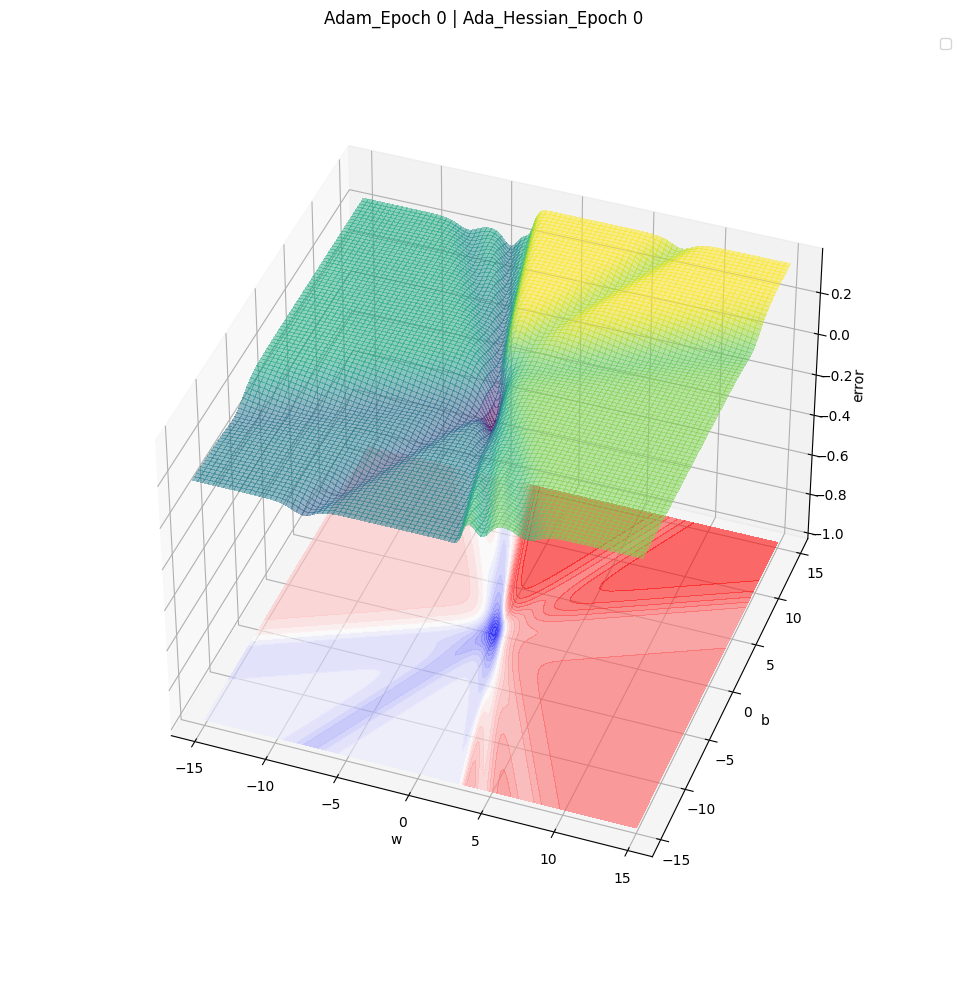

In [28]:
plot_3d = True

def error(X, Y, WW, BB):
    Z = np.zeros_like(WW)
    for i in range(len(WW)):
        for j in range(len(BB)):
            pred = torch.sigmoid(torch.tensor(WW[i, j]) * X + torch.tensor(BB[i, j]))
            Z[i, j] = criterion(pred, Y).item()
    return Z

if plot_3d:
    W = np.linspace(w_min, w_max, 256)
    b = np.linspace(b_min, b_max, 256)
    WW, BB = np.meshgrid(W, b)
    Z = error(X, Y, WW, BB)

    fig = plt.figure(figsize=(20,10),dpi=100)
    ax = fig.add_subplot(111, projection='3d')
    surf = ax.plot_surface(WW, BB, Z, rstride=3, cstride=3, alpha=0.5, cmap='viridis', linewidth=0, antialiased=False)
    cset = ax.contourf(WW, BB, Z, 25, zdir='z', offset=-1, alpha=0.6, cmap=cm.bwr)
    ax.set_xlabel('w')
    ax.set_xlim(w_min - 1, w_max + 1)
    ax.set_ylabel('b')
    ax.set_ylim(b_min - 1, b_max + 1)
    ax.set_zlabel('error')
    ax.set_zlim(-1, np.max(Z))
    ax.view_init(elev=40, azim=-70)  # azim = -20
    ax.dist = 12
    ax.legend()
    title = ax.set_title('Adam_Epoch 0 | Ada_Hessian_Epoch 0')
    plt.savefig('3d ADA vs ADAM',dpi=600)
    fig.tight_layout()
    plt.show()



## 3D Visulization_block

In [29]:
def plot_animate_3d(i):
  i = int(i*(epochs/animation_frames))
  line1.set_data(adam_weights[:i+1], adam_biases[:i+1])
  line1.set_3d_properties(adam_losses[:i+1])

  line2.set_data(adam_weights[:i+1],adam_biases[:i+1])
  line2.set_3d_properties(np.zeros(i+1) - 1)

  ada_line1.set_data(ada_weights[:i+1], ada_biases[:i+1])
  ada_line1.set_3d_properties(ada_losses[:i+1])

  ada_line2.set_data(ada_weights[:i+1],ada_biases[:i+1])
  ada_line2.set_3d_properties(np.zeros(i+1) - 1)

  combined_error = 'Epoch: {: d}, Adam_Error: {:.4f} | AdaHessian Error: {:.4f}'.format(i, adam_losses[i], ada_losses[i])
  title.set_text(combined_error)

  return line1, line2,ada_line1,ada_line2, title
plot_3d=True
if plot_3d:
  i = 0
  line1, = ax.plot(adam_weights[:i+1], adam_biases[:i+1], adam_losses[:i+1], color='black',marker='.',label='Adam')
  line2, = ax.plot(adam_weights[:i+1],adam_biases[:i+1], np.zeros(i+1) - 1, color='black', marker='.')
  ada_line1, = ax.plot(ada_weights[:i+1],ada_biases[:i+1], ada_losses[:i+1], color='red',marker='.',label='Adahessian')
  ada_line2, = ax.plot(ada_weights[:i+1],ada_biases[:i+1], np.zeros(i+1) - 1, color='red', marker='.')
  ax.legend()
  anim = animation.FuncAnimation(fig, func=plot_animate_3d, frames=animation_frames)

  rc('animation', html='jshtml')
  # Save the animation as a GIF using Pillow
  anim.save('3DAdam_vs_ADAhessian.gif', writer='pillow')
  anim


In [30]:
anim